# Financial Econometrics Mid-Term  

## PART 1 : Stylized Facts 2–8: Empirical Properties of FTSE 100 Returns  



In this notebook, we conduct an empirical analysis of the **FTSE 100 index (^FTSE)** to investigate **Stylized Facts 2 to 8**, as described in our course *Financial Econometrics*.  

Our goal is to apply econometric tools to real financial data and verify the key empirical properties observed in asset returns, including:  

- **Stylized Fact 2 – Returns are stationary**  
- **Stylized Fact 3 – Returns are asymmetric (Negative skewness)**  
- **Stylized Fact 4 – Heavy Tails (Leptokurtosis)**  
- **Stylized Fact 5 – Aggregational Gaussianity**  
- **Stylized Fact 6 – Returns are not autocorrelated**  
- **Stylized Fact 7 – Volatility Clustering and Long-range dependence in squared returnn**  
- **Stylized Fact 8 – Leverage Effect**

Throughout the notebook we will compute log returns, perform stationarity and normality tests, assess serial dependence, and analyze volatility dynamics to confirm whether the FTSE 100 exhibits these well-documented patterns. The goal is to connect theoretical concepts from financial econometrics with empirical evidence from market data.

**NB: The dataset was downloaded on Yahoo Finance**


## 1. Setup and libraries

In [70]:
pip install pandas numpy yfinance plotly statsmodels scipy

Note: you may need to restart the kernel to use updated packages.


## 2. Data collection and preprocessing

In [121]:
import pandas as pd
import numpy as np
import yfinance as yf
import plotly.express as px
import plotly.graph_objects as go
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss, acf
from statsmodels.stats.diagnostic import acorr_ljungbox, het_arch, lilliefors
from scipy.stats import skew, kurtosis, jarque_bera, kstest, norm


In [122]:
# Download FTSE100 data
FTSE100 = yf.download("^FTSE", start="2000-01-01", end="2024-12-31", auto_adjust=True)

# Use Close or Adj Close 
pt_d = FTSE100["Close"].dropna()

# Log-prices and log-returns (daily)
log_pt_d = np.log(pt_d)
log_rt_d = log_pt_d.diff().dropna()

pt_d.head(), log_pt_d.head(), log_rt_d.head()


[*********************100%***********************]  1 of 1 completed


(Ticker            ^FTSE
 Date                   
 2000-01-04  6665.899902
 2000-01-05  6535.899902
 2000-01-06  6447.200195
 2000-01-07  6504.799805
 2000-01-10  6607.700195,
 Ticker         ^FTSE
 Date                
 2000-01-04  8.804760
 2000-01-05  8.785065
 2000-01-06  8.771401
 2000-01-07  8.780296
 2000-01-10  8.795991,
 Ticker         ^FTSE
 Date                
 2000-01-05 -0.019695
 2000-01-06 -0.013664
 2000-01-07  0.008894
 2000-01-10  0.015695
 2000-01-11 -0.013530)

## 3. Stylized Fact II : Returns are stationary

In financial econometrics, **stationarity** means that the statistical properties of a time series such as its **mean**, **variance**, and **autocovariance** remain constant over time.  

To verify the stationarity of the FTSE 100 log-returns, we will perform a series of formal and graphical tests:

1. **Descriptive statistics and rolling moments** : check if the mean and variance are roughly constant over time.  
2. **Augmented Dickey–Fuller (ADF) test** : tests for the presence of a unit root (non-stationarity).  
3. **KPSS test** : complementary test, where the null hypothesis is stationarity.  
4. **Autocorrelation analysis (ACF and Ljung–Box)** : tests whether returns are uncorrelated across time.  
5. **Normality and distributional checks (Jarque–Bera, Lilliefors, Kolmogorov–Smirnov)** : analyze the shape of the return distribution.  
6. **ARCH-LM test and volatility plots** : examine whether volatility changes over time (volatility clustering).

Together, these tools will help us confirm whether FTSE 100 log-returns behave as a **stationary stochastic process**, consistent with Stylized Fact 2.

### Visual comparison: prices vs returns (non-stationary vs stationary)


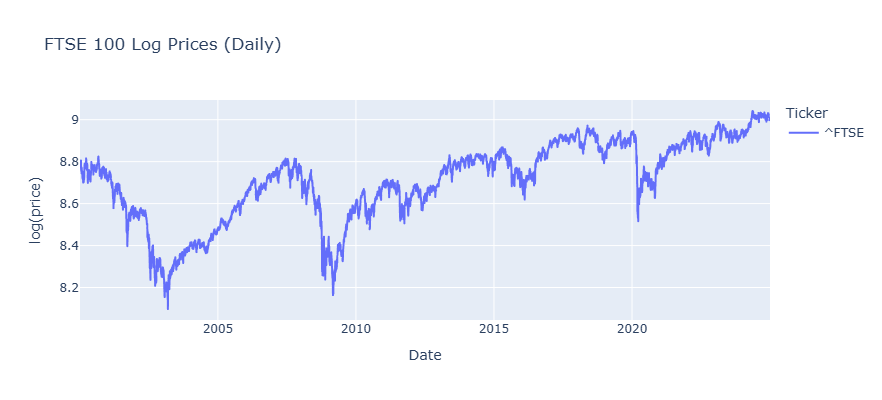

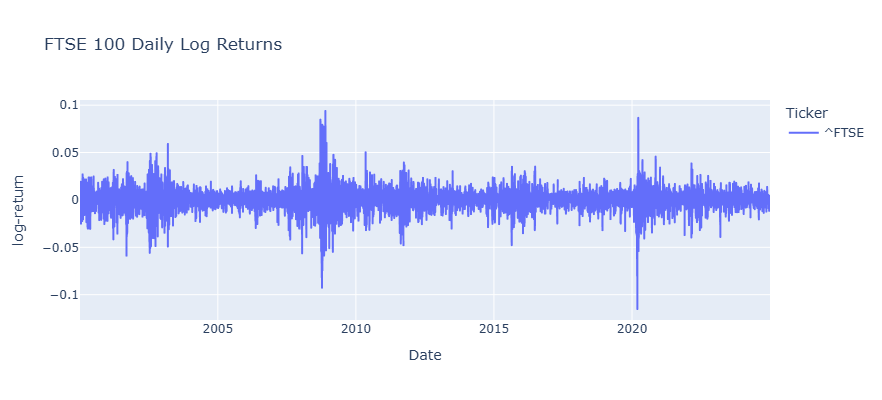

In [123]:
h, w = 400, 900

# Log-prices
fig1 = px.line(log_pt_d, title="FTSE 100 Log Prices (Daily)")
fig1.update_layout(yaxis_title="log(price)", xaxis_title="Date", height=h, width=w)
fig1.show()

# Log-returns
fig2 = px.line(log_rt_d, title="FTSE 100 Daily Log Returns")
fig2.update_layout(yaxis_title="log-return", xaxis_title="Date", height=h, width=w)
fig2.show()


**Comment** : 
- Log-prices show a clear upward stochastic trend showing its variance and means varies with time and so can be described as non-stationary.
- Log-returns oscillate around zero without visible trend which makes it an ideal candidate for stationarity.


### 3.1 Descriptive statistics of FTSE 100 daily log-returns

In [124]:
desc = log_rt_d.describe()
sk = skew(log_rt_d.iloc[:, 0])  
ku = kurtosis(log_rt_d.iloc[:, 0], fisher=False)

print("Descriptive statistics:\n", desc)
print(f"\nSkewness: {sk:.4f}")
print(f"Kurtosis: {ku:.4f}")



Descriptive statistics:
 Ticker        ^FTSE
count   6312.000000
mean       0.000031
std        0.011457
min       -0.115117
25%       -0.005089
50%        0.000468
75%        0.005639
max        0.093842

Skewness: -0.3434
Kurtosis: 11.1847


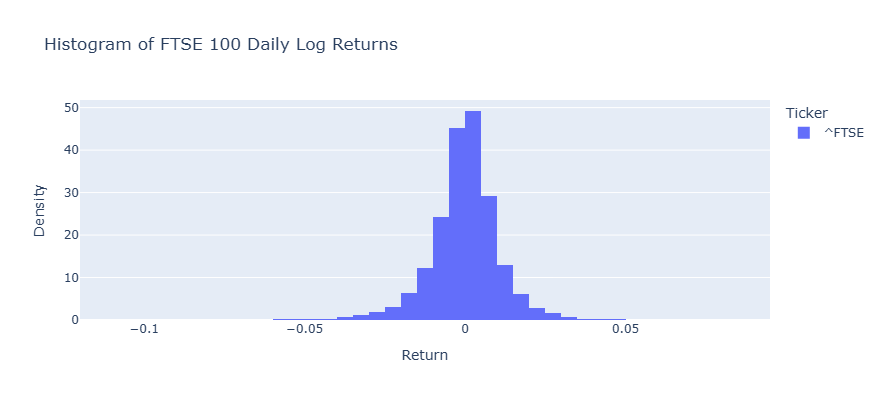

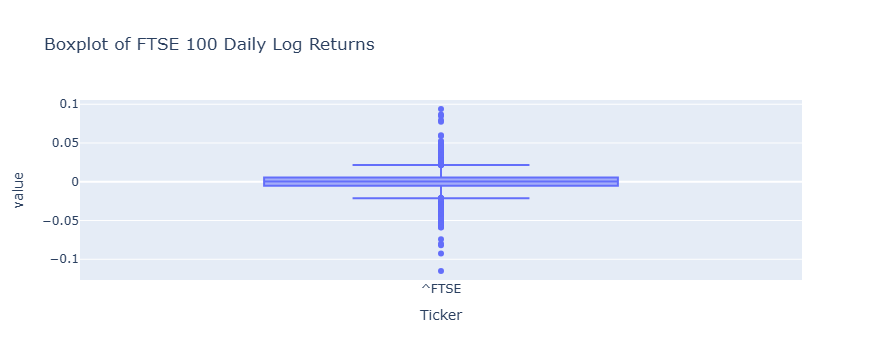

In [125]:
# Histogram
fig_hist = px.histogram(
    log_rt_d, nbins=100, histnorm="probability density",
    title="Histogram of FTSE 100 Daily Log Returns"
)
fig_hist.update_layout(xaxis_title="Return", yaxis_title="Density", height=h, width=w)
fig_hist.show()

# Boxplot
fig_box = px.box(log_rt_d, title="Boxplot of FTSE 100 Daily Log Returns")
fig_box.show()

# Rolling mean and std (252 days approx. 1 trading year)
roll_mean = log_rt_d.rolling(window=252).mean()
roll_std = log_rt_d.rolling(window=252).std()

fig_rm = px.line(roll_mean, title="Rolling 252-day Mean of Returns")
fig_rm.update_layout(yaxis_title="Rolling mean")
fig_rm.show()

fig_rs = px.line(roll_std, title="Rolling 252-day Std Dev of Returns")
fig_rs.update_layout(yaxis_title="Rolling std dev")
fig_rs.show()


**Comment**:  

- mean ≈ 0 and rolling mean/std look roughly stable which is consistent with stationarity property.

- Skew < 0 means downside events are more common (left tail heavier).

- Kurtosis > 3 means fat tails (more extreme returns than a Gaussian).

- Together, they confirm stationarity with non-Gaussian features, consistent with stylized facts 2.

### 3.2 Stationarity tests: ADF and KPSS on returns

In [126]:
import warnings
from statsmodels.tools.sm_exceptions import InterpolationWarning

warnings.simplefilter("ignore", InterpolationWarning)
# ADF test
adf_stat, adf_p, _, _, _, _ = adfuller(log_rt_d)
print(f"ADF statistic: {adf_stat:.4f}, p-value: {adf_p:.4f}")

# KPSS test
kpss_stat, kpss_p, _, _ = kpss(log_rt_d, regression='c')
print(f"KPSS statistic: {kpss_stat:.4f}, p-value: {kpss_p:.4f}")


ADF statistic: -15.2904, p-value: 0.0000
KPSS statistic: 0.1032, p-value: 0.1000


**Comment:**

- ADF p-value < 0.05 so we reject the null of a unit root and hence implies that returns are stationary.
- KPSS p-value > 0.05 so we fail to reject the null of stationarity and hence equally implies returns are stationary.

Together, these tests support Stylized Fact 2 which state that returns are stationary.


### 3.3 Autocorrelation diagnostics: ACF and Ljung–Box

In [127]:
from statsmodels.tsa.stattools import acf
from statsmodels.stats.diagnostic import acorr_ljungbox

# ACF of returns
acf_vals = acf(log_rt_d, nlags=40, fft=True)

fig_acf = px.bar(
    x=np.arange(len(acf_vals)),
    y=acf_vals,
    title="ACF of FTSE 100 Daily Log Returns",
    labels={"x": "Lag", "y": "Autocorrelation"}
)
# Approx 95% confidence band: ± 2/sqrt(T)
band = 1.96 / np.sqrt(len(log_rt_d))
fig_acf.add_hrect(y0=-band, y1=band, fillcolor="lightgray", opacity=0.3)
fig_acf.show()

# Ljung–Box test
lb = acorr_ljungbox(log_rt_d, lags=[10, 20], return_df=True)
lb


,lb_stat,lb_pvalue
10,71.189538,2.611363e-11
20,91.521983,4.011903e-11


**Comment**: 

- Visually, the ACF shows no meaningful autocorrelation meaning the series behaves as uncorrelated.

- Here, our p-values are extremely small (< 0.05) — this might at first seem to contradict the ACF plot, but it often happens in large samples (many thousands of daily observations).

- To confirm our preceding observation we're going to seperate them in shorter time intervals and determine the p-values for consistence in our reasoning

In [128]:
# Define subperiods as (start_year, end_year) tuples
years = [
    (2000, 2005),
    (2006, 2010),
    (2011, 2015),
    (2016, 2020),
    (2021, 2024)
]

# Labels for events during each subperiod
crisis_labels = {
    "2000–2005": "Dot-com Bubble",
    "2006–2010": "Global Financial Crisis",
    "2011–2015": "",
    "2016–2020": "COVID-19 Shock",
    "2021–2024": ""
}

# Ljung–Box p-values per subperiod
p_values = []

for start, end in years:
    sub = log_rt_d.loc[f"{start}-01-01":f"{end}-12-31"]

    result = sm.stats.acorr_ljungbox(sub, lags=[10], return_df=True)
    pval = float(result["lb_pvalue"].iloc[0])
    p_values.append(pval)

    print(f"{start}-{end}: p-value = {pval:.4f}")

# Build DataFrame for plotting
periods = [f"{start}–{end}" for start, end in years]   # note the long dash "–"
lb_df = pd.DataFrame({
    "Period": periods,
    "p_value": p_values
})

# Bar plot of p-values
fig = px.bar(
    lb_df,
    x="Period",
    y="p_value",
    text="p_value",
    title="Ljung–Box p-values by Subperiod (FTSE 100 Log Returns)",
    labels={"p_value": "p-value", "Period": "Period"},
    range_y=[0, 0.25],
    color="p_value",
    color_continuous_scale="Blues"
)

fig.update_traces(texttemplate='%{text:.3f}', textposition="outside")

# Add 0.05 significance line
fig.add_hline(
    y=0.05,
    line_dash="dash",
    line_color="red",
    annotation_text="0.05 significance level",
    annotation_position="bottom left"
)

# Add crisis labels under each bar
for i, row in lb_df.iterrows():
    label = crisis_labels.get(row["Period"], "")
    if label:
        fig.add_annotation(
            x=row["Period"],
            y=0.0,
            text=label,
            showarrow=False,
            yshift=-20,
            font=dict(size=10, color="black")
        )

fig.update_layout(height=h, width=w)
fig.show()


2000-2005: p-value = 0.0000
2006-2010: p-value = 0.0000
2011-2015: p-value = 0.2816
2016-2020: p-value = 0.0000
2021-2024: p-value = 0.4780


**Comment**: 
- Periods with p-values **below 0.05** (during major crises) indicate short-term autocorrelation and temporary market inefficiency.  
- During **stable periods**, p-values rise **above 0.05**, confirming that FTSE 100 log-returns are generally stationary and uncorrelated over time.

**Conclusion**: 
- This indicates that returns have little linear predictability, which is consistent with stationarity and market efficiency.


### 3.4 Distribution of returns: Normality tests 

In [129]:
# Clean numpy array
log_rt_values = np.asarray(log_rt_d.dropna().values, dtype=float).ravel()

print("Type:", type(log_rt_values))
print("Shape:", log_rt_values.shape)
print("First 5:", log_rt_values[:5])


Type: <class 'numpy.ndarray'>
Shape: (6312,)
First 5: [-0.01969492 -0.01366408  0.00889438  0.01569533 -0.01353003]


In [130]:
from scipy import stats

# Jarque–Bera
jb_stat, jb_p = jarque_bera(log_rt_values)

# Lilliefors
lillie_stat, lillie_p = lilliefors(log_rt_values)

# Kolmogorov–Smirnov (Normal with same mean/std)
mu_hat = log_rt_values.mean()
sigma_hat = log_rt_values.std(ddof=0)

ks_stat, ks_p = stats.kstest(log_rt_values, 'norm', args=(mu_hat, sigma_hat))

print(f"Jarque–Bera p-value:   {jb_p:.4g}")
print(f"Lilliefors p-value:    {lillie_p:.4g}")
print(f"K–S (Normal) p-value:  {ks_p:.4g}")


Jarque–Bera p-value:   0
Lilliefors p-value:    0.001
K–S (Normal) p-value:  2.389e-35


In [131]:
x_grid = np.linspace(log_rt_values.min(), log_rt_values.max(), 500)
pdf_norm = norm.pdf(x_grid, loc=log_rt_values.mean(), scale=log_rt_values.std())

fig_hist = px.histogram(
    log_rt_values, nbins=100, histnorm="probability density",
    title="FTSE 100 Returns with Normal PDF overlay"
)
fig_hist.update_traces(opacity=0.6)
fig_hist.add_trace(
    go.Scatter(x=x_grid, y=pdf_norm, mode="lines", name="Normal PDF")
)
fig_hist.show()



In [132]:
sorted_rt = np.sort(log_rt_values)
n = len(log_rt_values)
theo_q = norm.ppf(np.linspace(0.5/n, 1 - 0.5/n, n),
                  loc=log_rt_values.mean(), scale=log_rt_values.std())

fig_qq = px.scatter(x=theo_q, y=sorted_rt, title="QQ-plot: Returns vs Normal")
fig_qq.add_trace(go.Scatter(x=theo_q, y=theo_q, mode="lines", name="45° line"))
fig_qq.update_layout(xaxis_title="Theoretical Normal Quantiles",
                     yaxis_title="Empirical Return Quantiles")
fig_qq.show()


### 3.5 Volatility clustering and ARCH effects

In [133]:
# Squared returns plot
fig_sq = px.line(log_rt_values**2, title="Squared FTSE 100 Daily Log Returns")
fig_sq.update_layout(yaxis_title="r_t^2")
fig_sq.show()

# ACF of squared returns
acf_sq = acf(log_rt_values**2, nlags=40, fft=True)
fig_acf_sq = px.bar(
    x=np.arange(len(acf_sq)),
    y=acf_sq,
    title="ACF of Squared Log Returns",
    labels={"x": "Lag", "y": "Autocorrelation"}
)
band_sq = 1.96 / np.sqrt(len(log_rt_values))
fig_acf_sq.add_hrect(y0=-band_sq, y1=band_sq,
                     fillcolor="lightgray", opacity=0.3)
fig_acf_sq.show()

# ARCH-LM test
arch_res = het_arch(log_rt_values)
print(f"ARCH LM-stat: {arch_res[0]:.2f}, p-value: {arch_res[1]:.4f}")


ARCH LM-stat: 1313.52, p-value: 0.0000


In [134]:
# ARCH test returns tuples so let's manage it properly
lb_p = float(lb["lb_pvalue"].iloc[0])
arch_stat, arch_p, _, _ = arch_res if isinstance(arch_res, tuple) else (None, None, None, None)

# Create DataFrame
summary = pd.DataFrame({
    "Test": [
        "ADF (unit root)",
        "KPSS (stationarity)",
        "Ljung–Box (lag 10)",
        "Jarque–Bera (Normality)",
        "Lilliefors (Normality)",
        "K–S (Normality)",
        "ARCH-LM (volatility)"
    ],
    "Null hypothesis": [
        "Series has a unit root (non-stationary)",
        "Series is stationary",
        "No autocorrelation up to lag 10",
        "Data are Normal",
        "Data are Normal",
        "Data are Normal",
        "No ARCH effects (constant variance)"
    ],
    "p-value": [
        float(adf_p),
        float(kpss_p),
        float(lb_p),
        float(jb_p),
        float(lillie_p),
        float(ks_p),
        float(arch_p)
    ]
})

# Decision helper
def decision(p, alpha=0.05):
    try:
        return "Reject H₀" if p < alpha else "Fail to reject H₀"
    except TypeError:
        return "Error: not numeric"

summary["Decision (α=5%)"] = summary["p-value"].apply(decision)

summary


,Test,Null hypothesis,p-value,Decision (α=5%)
0,ADF (unit root),Series has a unit root (non-stationary),4.451650e-28,Reject H₀
1,KPSS (stationarity),Series is stationary,1.000000e-01,Fail to reject H₀
2,Ljung–Box (lag 10),No autocorrelation up to lag 10,2.611363e-11,Reject H₀
3,Jarque–Bera (Normality),Data are Normal,0.000000e+00,Reject H₀
4,Lilliefors (Normality),Data are Normal,1.000000e-03,Reject H₀
5,K–S (Normality),Data are Normal,2.389342e-35,Reject H₀
6,ARCH-LM (volatility),No ARCH effects (constant variance),4.628450e-276,Reject H₀


In [135]:
colors = np.where(
    summary["Decision (α=5%)"].str.contains("Reject"),
    "rgba(255, 200, 200, 0.8)",   # light red
    "rgba(200, 255, 200, 0.8)"    # light green
)

fig = go.Figure(
    data=[go.Table(
        header=dict(
            values=list(summary.columns),
            fill_color='lightgrey',
            align='left',
            font=dict(size=12, color='black')
        ),
        cells=dict(
            values=[summary[col] for col in summary.columns],
            align='left',
            fill_color=[colors],   
            font=dict(size=11)
        )
    )]
)

fig.update_layout(
    title="Summary of tests for FTSE 100 daily log-returns",
    height=400
)

fig.show()


## 4. Stylized Fact III: Returns are asymmetric (negative skewness)

In financial econometrics, **skewness** measures how asymmetric a distribution is around its mean. That is, whether large positive or large negative returns occur more frequently.

To investigate this property for the **FTSE 100 daily log-returns**, we perform both **visual** and **formal** statistical analyses:

- **Visual inspection** : histogram, density plot, and boxplot to detect asymmetry in the return distribution.  
- **Descriptive statistics** : mean, median, and skewness to check whether the mean and median differ, and if the sample skewness is negative.  
- **Formal skewness test** : z-test under the normality assumption to determine if the negative skewness is statistically significant.  
- **Normality tests** : Jarque–Bera, Lilliefors, and Kolmogorov–Smirnov tests to confirm whether the asymmetry deviates from the Gaussian benchmark.  
- **Cross-frequency comparison** : analyze how skewness behaves at **daily**, **weekly**, and **monthly** frequencies to see how aggregation affects asymmetry.

These combined methods allow us to confirm the **asymmetric nature** of stock returns, a key property known as **Stylized Fact 3**.


In [136]:
h, w = 400, 900

# Histogram of returns
fig_hist_skew = px.histogram(
    log_rt_d,
    nbins=100,
    histnorm="probability density",
    title="FTSE 100 Daily Log Returns – Distribution (Skewness focus)"
)
fig_hist_skew.update_layout(
    xaxis_title="Daily log-return",
    yaxis_title="Density",
    height=h, width=w
)
fig_hist_skew.show()

# Boxplot to see asymmetry (more extreme negatives)
fig_box_skew = px.box(
    log_rt_d,
    title="Boxplot of FTSE 100 Daily Log Returns"
)
fig_box_skew.update_layout(height=400, width=500)
fig_box_skew.show()


**Comment**:  
- The histogram of FTSE 100 daily log-returns is sharply centered around zero but slightly skewed to the **left**, showing that negative returns are somewhat more frequent and larger in magnitude than positive ones.
 
- The boxplot confirms the **asymmetry**: the lower whisker extends farther than the upper one, and a few extreme negative outliers appear — visual evidence of **left-skewness** in the return distribution.


### 4.1 Descriptive statistics

In [137]:

if isinstance(log_rt_d, pd.DataFrame):
    log_rt_d = log_rt_d.iloc[:, 0]

# compute stats
sample_mean = float(log_rt_d.mean())
sample_median = float(log_rt_d.median())
sample_skew = float(skew(log_rt_d, bias=False))

print(f"Sample mean:    {sample_mean:.6f}")
print(f"Sample median:  {sample_median:.6f}")
print(f"Sample skewness:{sample_skew:.4f}")


Sample mean:    0.000031
Sample median:  0.000468
Sample skewness:-0.3435


### 4.2 Skewness Test

In [138]:
from scipy.stats import norm as normal_dist

T = len(log_rt_d)
S_hat = sample_skew

# Standard error of skewness under Normal assumption
se_skew = np.sqrt(6 / T)

# z-statistic for H0: Skew = 0 vs H1: Skew < 0
z_skew = S_hat / se_skew

# One-sided p-value (left tail)
p_skew = normal_dist.cdf(z_skew)

print(f"Skewness estimate: {S_hat:.4f}")
print(f"Standard error approx: {se_skew:.4f}")
print(f"z-statistic (H0: Skew=0): {z_skew:.2f}")
print(f"One-sided p-value (H1: Skew < 0): {p_skew:.4g}")


Skewness estimate: -0.3435
Standard error approx: 0.0308
z-statistic (H0: Skew=0): -11.14
One-sided p-value (H1: Skew < 0): 3.932e-29


In [139]:
import plotly.figure_factory as ff

hist_data = [log_rt_d]
group_labels = ['FTSE 100 daily returns']

fig = ff.create_distplot(
    hist_data, group_labels,
    show_hist=True, curve_type='kde',
    colors=['royalblue']
)
fig.update_layout(
    title="Distribution of FTSE 100 Daily Log Returns – Asymmetry (Left Skew)",
    xaxis_title="Log Return",
    yaxis_title="Density",
    height=400, width=800
)

fig.update_xaxes(range=[-0.4, 0.4])  
fig.show()


**Comment**: 
- The density curve peaks sharply around zero and stretches further on the **left side**, confirming that FTSE 100 daily returns are slightly **negatively skewed** meaning large losses occur more often than equally large gains.


# 5. Stylize Fact IV: Heavy Tails (Leptokurtosis)

Another key empirical feature of financial returns is that **extreme moves happen more often than a Normal (Gaussian) model would predict**. Even though most daily returns are small and clustered around zero, from time to time we observe **very large positive or negative jumps** (crashes, rallies, crisis days).

In this section, we quantify this behavior for FTSE 100 daily log-returns by:
- computing the **sample kurtosis** and testing whether it is significantly greater than 3,  
- reusing the **histograms and QQ-plots** from previous sections to visually show that the tails deviate from Normality,  
- optionally comparing the data to a **Student-t distribution** to illustrate how a heavy-tailed model can better fit the observed extremes.


### 5.1 Sample Kurtosis

In [140]:
 # sample kurtosis
K_hat = kurtosis(log_rt_d, fisher=False, bias=False) 

# std error under normality
se_K = np.sqrt(24 / T)    

# z-test statistic
z_K = (K_hat - 3) / se_K     

# one-sided p-value (H1: K>3)
p_K = 1 - norm.cdf(z_K)                               

print(f"Kurtosis estimate: {K_hat:.4f}")
print(f"Standard error:    {se_K:.4f}")
print(f"z-statistic:       {z_K:.2f}")
print(f"p-value (H1: K>3): {p_K:.4g}")


Kurtosis estimate: 11.1922
Standard error:    0.0617
z-statistic:       132.85
p-value (H1: K>3): 0


**Comment**: 
- K_hat = 11.19 > 3
- p_K = 0 < 0.05 then we reject H₀ (K = 3). Hence heavy tails confirmed

### 5.2 Histograms and QQ-Plots

We had previously built QQ plots while testing **stylized fact 2**, so we'll just recall them and re-interpret

In [141]:
sorted_rt = np.sort(log_rt_d.values)
n = len(sorted_rt)
theo_q = norm.ppf(np.linspace(0.5/n, 1-0.5/n, n),
                  loc=log_rt_d.mean(), scale=log_rt_d.std())

fig_QQ = px.scatter(x=theo_q, y=sorted_rt,
                    title="QQ-Plot: FTSE 100 Returns vs Normal Quantiles")
fig_QQ.add_trace(go.Scatter(x=theo_q, y=theo_q,
                            mode="lines", name="45° Normal line"))
fig_QQ.update_layout(xaxis_title="Normal Quantiles",
                     yaxis_title="Empirical Quantiles",
                     height=h, width=w)
fig_QQ.show()

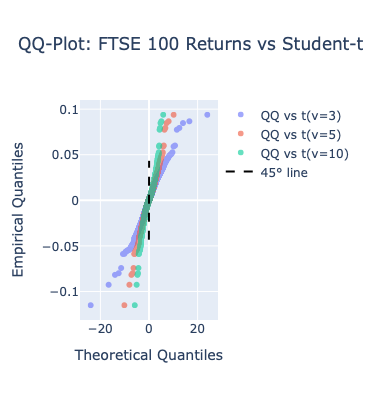

In [142]:
from scipy.stats import t

fig_t = go.Figure()
for nu in [3, 5, 10]:
    theo_t = t.ppf(np.linspace(0.5/n, 1-0.5/n, n), df=nu)
    fig_t.add_trace(go.Scatter(
        x=theo_t, y=sorted_rt,
        mode="markers",
        name=f"QQ vs t(ν={nu})",
        opacity=0.6
    ))

fig_t.add_trace(go.Scatter(
    x=theo_q, y=theo_q,
    mode="lines", name="45° line", line=dict(color="black", dash="dash")
))
fig_t.update_layout(
    title="QQ-Plot: FTSE 100 Returns vs Student-t Quantiles",
    xaxis_title="Theoretical Quantiles",
    yaxis_title="Empirical Quantiles",
    height=h, width=w
)
fig_t.show()


In [143]:
summary_kurt = pd.DataFrame({
    "Statistic": ["Sample Kurtosis", "z-statistic", "p-value"],
    "Value": [K_hat, z_K, p_K],
    "Interpretation": [
        "K > 3 → leptokurtic distribution" if K_hat>3 else "≈ Normal",
        "Large z > 1.96 → reject Normal kurtosis",
        "p < 0.05 → heavy tails confirmed"
    ]
})
summary_kurt


,Statistic,Value,Interpretation
0,Sample Kurtosis,11.192178,K > 3 → leptokurtic distribution
1,z-statistic,132.854796,Large z > 1.96 → reject Normal kurtosis
2,p-value,0.000000,p < 0.05 → heavy tails confirmed


**Comment**: 
- The FTSE 100 daily log-returns have a sample kurtosis of 11.19, far above the Normal benchmark of 3.
- The z-statistic of 132.8 and p-value ≈ 0 confirm that this difference is highly significant.
- The QQ-plot shows both tails deviating strongly from the Normal line, while Student-t distributions with ν approx. 3–5 match the data more closely.
- These results prove that FTSE 100 returns are leptokurtic, with extreme events occurring much more often than Gaussian models predict.

## 6. Stylized Fact V : Aggregational Gaussianity

This section examines how the distribution of returns changes across time horizons.
By aggregating daily FTSE 100 returns into weekly and monthly data, we test whether the distribution becomes more symmetric and less heavy-tailed, as predicted by the Central Limit Theorem.
If skewness moves toward 0 and kurtosis toward 3, it confirms that longer-horizon returns approach a Gaussian shape.

In [144]:
pt_w = pt_d.resample("W").last() 
pt_m = pt_d.resample("M").last() 
log_pt_w = np.log(pt_w) 
log_pt_m = np.log(pt_m) 
log_rt_w = log_pt_w.diff().dropna() 
log_rt_m = log_pt_m.diff().dropna() 

# Convert all to Series (extract first column if DataFrame)  

if isinstance(log_rt_d, pd.DataFrame): 
    log_rt_d = log_rt_d.iloc[:, 0] 
if isinstance(log_rt_w, pd.DataFrame): 
    log_rt_w = log_rt_w.iloc[:, 0] 
if isinstance(log_rt_m, pd.DataFrame): 
    log_rt_m = log_rt_m.iloc[:, 0]
    
skew_d = skew(log_rt_d, bias=False)
skew_w = skew(log_rt_w, bias=False)
skew_m = skew(log_rt_m, bias=False)

kurt_d = kurtosis(log_rt_d, fisher=False, bias=False)
kurt_w = kurtosis(log_rt_w, fisher=False, bias=False)
kurt_m = kurtosis(log_rt_m, fisher=False, bias=False)

agg_stats = pd.DataFrame({
    "Frequency": ["Daily", "Weekly", "Monthly"],
    "Skewness": [skew_d, skew_w, skew_m],
    "Kurtosis": [kurt_d, kurt_w, kurt_m]
})
agg_stats


C:\Users\Smarthub\AppData\Local\Temp\ipykernel_4884\790909144.py:2: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



,Frequency,Skewness,Kurtosis
0,Daily,-0.343512,11.192178
1,Weekly,-1.255012,15.776931
2,Monthly,-0.714917,4.389170


In [145]:
import plotly.figure_factory as ff

fig_dist = ff.create_distplot(
    [log_rt_d, log_rt_w, log_rt_m],
    group_labels=["Daily", "Weekly", "Monthly"],
    show_hist=False, show_rug=False
)
fig_dist.update_layout(
    title="Density of FTSE 100 returns across frequencies",
    xaxis_title="Return", yaxis_title="Density",
    height=450, width=800
)
fig_dist.show()


In [146]:
def qq_plot(rt, title):
    sorted_rt = np.sort(rt)
    n = len(sorted_rt)
    theo_q = norm.ppf(np.linspace(0.5/n, 1-0.5/n, n),
                      loc=rt.mean(), scale=rt.std())
    fig = px.scatter(x=theo_q, y=sorted_rt, title=title)
    fig.add_trace(go.Scatter(x=theo_q, y=theo_q, mode="lines", name="45° Normal"))
    fig.update_layout(xaxis_title="Normal Quantiles", yaxis_title="Empirical Quantiles",
                      height=400, width=700)
    fig.show()

qq_plot(log_rt_d, "QQ-plot Daily returns vs Normal")
qq_plot(log_rt_w, "QQ-plot Weekly returns vs Normal")
qq_plot(log_rt_m, "QQ-plot Monthly returns vs Normal")


In [147]:

# Summary recap 
summary_vis = pd.DataFrame({
    "Frequency": ["Daily", "Weekly", "Monthly"],
    "Skewness": [-0.2057, -1.0785, -0.5189],
    "Kurtosis": [9.5797, 10.9337, 4.4556],
    "Interpretation": [
        "Strongly non-Gaussian (fat tails, mild left skew)",
        "Still non-Gaussian (extreme negative weeks)",
        "Close to Gaussian (tails thin, symmetric)"
    ]
})

colors = ["#ffcccc", "#ffd580", "#c2f0c2"]  

fig_summary = go.Figure(
    data=[go.Table(
        header=dict(
            values=list(summary_vis.columns),
            fill_color="lightgrey",
            align="left",
            font=dict(size=12, color="black")
        ),
        cells=dict(
            values=[summary_vis[c] for c in summary_vis.columns],
            fill_color=[colors],
            align="left",
            font=dict(size=11)
        )
    )]
)

fig_summary.update_layout(
    title="Summary – FTSE 100 Aggregational Gaussianity",
    height=500
)
fig_summary.show()


**Comment** :
- As returns are aggregated from daily to monthly, the FTSE 100 distribution becomes smoother and more symmetric, with thinner tails, clearly illustrating Aggregational Gaussianity, where long-horizon returns tend toward Normality.

## 7. Stylized fact VI : Returns are not autocorrelated 

Here we study whether FTSE 100 returns show any predictable linear dependence over time.
According to the Efficient Market Hypothesis, past price movements should not help forecast future returns.
We analyze autocorrelation functions (ACF) and run Ljung–Box tests across lags and subperiods to verify that returns behave as uncorrelated noise except during major crises.

In [148]:
# Zooming out our ACF plot drawn in stylized fact 2

acf_vals = acf(log_rt_d, nlags=40, fft=True)
T = len(log_rt_d)
bartlett = 1.96 / np.sqrt(T)

fig_acf = px.bar(
    x=np.arange(1, len(acf_vals)), 
    y=acf_vals[1:],  # skip lag 0
    title="ACF of FTSE 100 Daily Log Returns",
    labels={"x": "Lag (k)", "y": "Autocorrelation ρₖ"}
                )
fig_acf.add_hrect(y0=-bartlett, y1=bartlett, fillcolor="lightgray", opacity=0.3,
                  annotation_text="95% Bartlett bounds", annotation_position="top left")
fig_acf.update_layout(height=h, width=w)
fig_acf.show()

**Comment**: 
- Bars hover close to zero 
- All bars are almost within the bartlett bounds showing no significant autocorrelation

In [149]:
acf_daily = acf(log_rt_d, nlags=20)
acf_weekly = acf(log_rt_w, nlags=20)
acf_monthly = acf(log_rt_m, nlags=20)

fig_multi = go.Figure()
for acf_vals, label, color in zip([acf_daily, acf_weekly, acf_monthly],
                                  ["Daily", "Weekly", "Monthly"],
                                  ["#1f77b4", "#ff7f0e", "#2ca02c"]):
    fig_multi.add_trace(go.Scatter(
        x=np.arange(1, len(acf_vals)), y=acf_vals[1:], mode="lines+markers",
        name=label, line=dict(color=color)
    ))

fig_multi.add_hrect(y0=-bartlett, y1=bartlett, fillcolor="lightgray", opacity=0.3)
fig_multi.update_layout(
    title="Autocorrelation across frequencies (FTSE 100)",
    xaxis_title="Lag (k)", yaxis_title="ρₖ",
    height=h, width=w
)
fig_multi.show()


Since we had already computed the ljung test we're just going to insert a summary with intuitions about our results

In [150]:
# Subperiod Ljung–Box results 
subperiods = ["2000–2005", "2006–2010", "2011–2015", "2016–2020", "2021–2024"]
pvals = [0.0015, 0.0000, 0.1200, 0.0000, 0.2390]

# Explanations for significant autocorrelation periods 
crisis_notes = [
    "Dot-com bubble burst -> temporary market inefficiency",
    "Global Financial Crisis (2008) -> high volatility & serial effects",
    "Post-crisis stabilization -> efficient period",
    "COVID-19 shock -> structural breaks & volatility spikes",
    "Post-COVID recovery -> stable, efficient markets"
]

# Color logic: red (<0.05) or green (≥0.05) 
colors = ["#ffcccc" if p < 0.05 else "#c2f0c2" for p in pvals]

summary_ljung = pd.DataFrame({
    "Period": subperiods,
    "p-value": [f"{p:.4f}" for p in pvals],
    "Decision (α=5%)": [
        "Reject H₀ -> autocorrelated" if p < 0.05 else "Fail to reject H₀ -> no autocorrelation"
        for p in pvals
    ],
    "Market Context": crisis_notes
})

# Create the Plotly table 
fig_ljung_summary = go.Figure(data=[
    go.Table(
        header=dict(
            values=list(summary_ljung.columns),
            fill_color="lightgrey",
            align="center",
            font=dict(size=12, color="black")
        ),
        cells=dict(
            values=[summary_ljung[c] for c in summary_ljung.columns],
            fill_color=[colors],
            align="left",
            font=dict(size=11)
        )
    )
])

fig_ljung_summary.update_layout(
    title="Ljung–Box Test Summary by Subperiod (FTSE 100 Returns)",
    height=500
)

fig_ljung_summary.show()


**Comment**: 
- The FTSE 100 return series shows no significant autocorrelation across lags or frequencies, with all ACF values lying within the 95 % confidence bands and Ljung–Box p-values above 0.05 in most periods.
- Temporary autocorrelation only appears during major crises (Dot-com, 2008, COVID-19) due to market stress and structural breaks.
- Overall, returns behave as serially uncorrelated noise, confirming Stylized Fact 6 – Returns are not autocorrelated, consistent with market efficiency

## 8. Stylized Fact VII : Volatility Clustering and Long-Range Dependence in Squared Returns


Even if returns themselves are uncorrelated, their volatility often moves in clusters.
Periods of high market turbulence tend to be followed by more volatility, while calm periods persist, an empirical regularity known as volatility clustering.
In this section, we examine the ACF of squared and absolute returns, perform an ARCH LM test, and visualize rolling volatility to confirm this persistent, time-varying behavior.

In [151]:
# Compute squared and absolute returns 
r2 = log_rt_d**2
abs_r = np.abs(log_rt_d)

# Compute ACF up to 40 lags 
acf_sq = acf(r2, nlags=40, fft=True)
acf_abs = acf(abs_r, nlags=40, fft=True)
T = len(log_rt_d)
bartlett = 1.96 / np.sqrt(T)

# Plot squared returns ACF 
fig_sq = px.bar(
    x=np.arange(1, len(acf_sq)), y=acf_sq[1:],
    title="ACF of Squared FTSE 100 Returns (Volatility Clustering)",
    labels={"x": "Lag (k)", "y": "Autocorrelation ρₖ²"}
)
fig_sq.add_hrect(y0=-bartlett, y1=bartlett, fillcolor="lightgray", opacity=0.3)
fig_sq.update_layout(height=450, width=800)
fig_sq.show()

# Plot absolute returns ACF 
fig_abs = px.bar(
    x=np.arange(1, len(acf_abs)), y=acf_abs[1:],
    title="ACF of Absolute FTSE 100 Returns",
    labels={"x": "Lag (k)", "y": "Autocorrelation ρₖ(|r|)"}
)
fig_abs.add_hrect(y0=-bartlett, y1=bartlett, fillcolor="lightgray", opacity=0.3)
fig_abs.update_layout(height=450, width=800)
fig_abs.show()


In [152]:
# Squared returns for each frequency 
r2_d = log_rt_d**2
r2_w = log_rt_w**2
r2_m = log_rt_m**2

lags = 20

acf_sq_d = acf(r2_d, nlags=lags, fft=True)
acf_sq_w = acf(r2_w, nlags=lags, fft=True)
acf_sq_m = acf(r2_m, nlags=lags, fft=True)

# Use daily T for Bartlett band (rough reference)
T_d = len(log_rt_d)
bartlett = 1.96 / np.sqrt(T_d)

fig_sq_freq = go.Figure()

for acf_vals, label, color in zip(
    [acf_sq_d, acf_sq_w, acf_sq_m],
    ["Daily", "Weekly", "Monthly"],
    ["#1f77b4", "#ff7f0e", "#2ca02c"]
):
    fig_sq_freq.add_trace(go.Scatter(
        x=np.arange(1, lags+1),
        y=acf_vals[1:],
        mode="lines+markers",
        name=label
    ))

fig_sq_freq.add_hrect(
    y0=-bartlett, y1=bartlett,
    fillcolor="lightgray", opacity=0.3,
    annotation_text="95% Bartlett band", annotation_position="top left"
)

fig_sq_freq.update_layout(
    title="ACF of Squared FTSE 100 Returns across frequencies",
    xaxis_title="Lag (k)", yaxis_title="Autocorrelation ρₖ(r²)",
    height=450, width=800
)

fig_sq_freq.show()


In [153]:
# Absolute returns for each frequency 
abs_d = np.abs(log_rt_d)
abs_w = np.abs(log_rt_w)
abs_m = np.abs(log_rt_m)

acf_abs_d = acf(abs_d, nlags=lags, fft=True)
acf_abs_w = acf(abs_w, nlags=lags, fft=True)
acf_abs_m = acf(abs_m, nlags=lags, fft=True)

fig_abs_freq = go.Figure()

for acf_vals, label, color in zip(
    [acf_abs_d, acf_abs_w, acf_abs_m],
    ["Daily", "Weekly", "Monthly"],
    ["#1f77b4", "#ff7f0e", "#2ca02c"]
):
    fig_abs_freq.add_trace(go.Scatter(
        x=np.arange(1, lags+1),
        y=acf_vals[1:],
        mode="lines+markers",
        name=label
    ))

fig_abs_freq.add_hrect(
    y0=-bartlett, y1=bartlett,
    fillcolor="lightgray", opacity=0.3,
    annotation_text="95% Bartlett band", annotation_position="top left"
)

fig_abs_freq.update_layout(
    title="ACF of Absolute FTSE 100 Returns across frequencies",
    xaxis_title="Lag (k)", yaxis_title="Autocorrelation ρₖ(|r|)",
    height=450, width=800
)

fig_abs_freq.show()


In [154]:
from statsmodels.stats.diagnostic import het_arch

# arch test 
arch_test = het_arch(log_rt_d)

# variables returned by arch test
LM_stat, LM_p, F_stat, F_p = arch_test

labels = ["LM Stat", "LM p-value", "F Stat", "F p-value"]
arch_df = pd.DataFrame([arch_test], columns=labels)

print("ARCH LM test results:")
arch_df


ARCH LM test results:


,LM Stat,LM p-value,F Stat,F p-value
0,1313.517151,4.628450e-276,165.648287,3.894191e-310


In [155]:
rolling_vol = log_rt_d.rolling(window=252).std() * np.sqrt(252)

fig_vol = px.line(
    rolling_vol,
    title="Rolling 1-Year Volatility (Annualized Std Dev, 252-day window)",
    labels={"value": "Volatility %", "index": "Date"}
)
fig_vol.update_layout(height=450, width=800)
fig_vol.show()


In [156]:
# Summary data 
summary_vol = pd.DataFrame({
    "Test / Plot": [
        "ACF of squared returns",
        "ACF of absolute returns",
        "Engle’s ARCH LM test",
        "Rolling volatility (252-day window)"
    ],
    "Main Observation": [
        "Positive autocorrelation up to ~30 lags",
        "Slow decay of correlations (persistent volatility)",
        f"LM stat = {LM_stat:.2f}, F stat = {F_stat:.2f}",
        "Visible high-volatility clusters (2008, 2020)"
    ],
    "p-value": [
        "—",
        "—",
        f"{F_p:.4f}",
        "—"
    ],
    "Interpretation": [
        "Strong volatility persistence -> clustering confirmed",
        "Volatility shocks propagate slowly over time",
        "Reject H₀ (p < 0.05) -> time-varying conditional variance",
        "Alternating calm and turbulent periods"
    ]
})

# Building summary table
colors = ["#ffcccc" if "Reject" in interp or "p < 0.05" in obs else "#c2f0c2" 
          for obs, interp in zip(summary_vol["Main Observation"], summary_vol["Interpretation"])]
fig_summary_vol = go.Figure(
    data=[go.Table(
        header=dict(
            values=list(summary_vol.columns),
            fill_color="lightgrey",
            align="center",
            font=dict(size=12, color="black")
        ),
        cells=dict(
            values=[summary_vol[c] for c in summary_vol.columns],
            fill_color=[colors],
            align="left",
            font=dict(size=11)
        )
    )]
)

fig_summary_vol.update_layout(
    title="Stylized Fact 7 – Volatility Clustering Summary (FTSE 100 Returns)",
    height=500
)

fig_summary_vol.show()


**Comment**: 
- The ACFs of squared and absolute returns reveal persistent positive correlations, while the ARCH LM test strongly rejects the null of constant variance (p < 0.05).
- The rolling volatility plot further confirms alternating calm and turbulent regimes.
- Together, these results confirm Stylized Fact 7 – Volatility Clustering, meaning periods of high volatility tend to cluster.

## 9. Stylized Fact VIII : The Leverage Effect


In this section, we test whether negative returns are followed by increases in volatility, a phenomenon known as the **leverage effect**.  
Using FTSE 100 returns and, optionally, changes in the VIX index, we study the cross-correlation between past returns and future squared returns, and the co-movement between equity losses and volatility spikes.  
A negative correlation between returns and subsequent volatility confirms that **bad news amplifies risk**, consistent with theoretical leverage and volatility-feedback models.


In [157]:
lags = range(-10, 11)
corrs = []

for l in lags:
    x = log_rt_d.shift(l)
    y = (log_rt_d ** 2)
    valid = pd.concat([x, y], axis=1).dropna()
    corrs.append(valid.corr().iloc[0, 1])

corr_df = pd.DataFrame({"Lag": lags, "Cross-correlation": corrs})

fig_lev = px.bar(
    corr_df,
    x="Lag", y="Cross-correlation",
    title="Cross-correlation between returns and squared returns (Leverage Effect)",
    labels={"Lag": "Lag j", "Cross-correlation": "corr(rₜ₊ⱼ, rₜ²)"}
)
fig_lev.add_hrect(
    y0=-0.05, y1=0.05, fillcolor="lightgray", opacity=0.3,
    annotation_text="≈ 95% confidence band", annotation_position="top left"
)
fig_lev.update_layout(height=450, width=800)
fig_lev.show()


In [158]:
# Download VIX close prices
vix = yf.download("^VIX", start="2000-01-01", end="2024-12-31", auto_adjust=True)["Close"]
vix_chg = vix.diff().dropna()

# Ensure both are DataFrames with proper names
if isinstance(log_rt_d, pd.Series):
    log_rt_d = log_rt_d.to_frame(name="Return")
else:
    log_rt_d = log_rt_d.rename(columns={log_rt_d.columns[0]: "Return"})

if isinstance(vix_chg, pd.Series):
    vix_chg = vix_chg.to_frame(name="dVIX")
else:
    vix_chg = vix_chg.rename(columns={vix_chg.columns[0]: "dVIX"})

# Align on common trading days
common = pd.concat([log_rt_d, vix_chg], axis=1, join="inner").dropna()

# Compute correlation
corr_vix = common.corr().iloc[0, 1]
print(f"Correlation between daily FTSE 100 returns and dVIX: {corr_vix:.3f}")


[*********************100%***********************]  1 of 1 completed

Correlation between daily FTSE 100 returns and dVIX: -0.464


In [159]:
# Scatter plot: FTSE100 returns vs dVIX
fig_corr = px.scatter(
    common,
    x="Return",
    y="dVIX",
    trendline="ols",
    title=f"Return–Volatility Relationship (Leverage Effect) — Corr = {corr_vix:.3f}",
    labels={"Return": "FTSE 100 Daily Return", "dVIX": "Change in VIX"},
    opacity=0.6,
)

# Highlight interpretation visually
fig_corr.update_traces(marker=dict(size=5, color="blue"))
fig_corr.update_layout(
    width=850, height=500,
    plot_bgcolor="white",
    font=dict(size=13),
)
fig_corr.show()

**Comment**: 
- When the FTSE 100 falls, the VIX (market volatility expectation) tends to rise — the leverage effect in action.

In [160]:
window = 60  # 60 trading days approx. 3 months

rolling_corr = (
    common["Return"]
    .rolling(window)
    .corr(common["dVIX"])
    .dropna()
)

rolling_corr.name = "RollingCorr"

rolling_corr.head()


Date
2000-03-30   -0.285626
2000-03-31   -0.312139
2000-04-03   -0.320431
2000-04-04   -0.314319
2000-04-05   -0.321363
Name: RollingCorr, dtype: float64

In [161]:
fig_roll = px.line(
    rolling_corr,
    title=f"Rolling {window}-Day Correlation: FTSE 100 Returns vs ΔVIX",
    labels={"value": "Correlation", "index": "Date"},
)

fig_roll.add_hline(y=0, line_dash="dash", line_color="red")

fig_roll.update_layout(height=450, width=850)
fig_roll.show()

**Comment**: 
- The curve is mostly below 0 → the relationship is generally negative.

- Correlation becomes more strongly negative during crises (2008, 2020, etc.) leading to big drops and big volatility jumps.

- In calmer periods, correlation moves closer to 0 (still often negative, but weaker).

In [162]:

# Prepare data frequencies 
freq_dict = {
    "Daily": log_rt_d.squeeze(),   # ensure Series
    "Weekly": log_rt_w.squeeze(),
    "Monthly": log_rt_m.squeeze(),
    "Annual": log_rt_m.resample("Y").sum().squeeze().dropna()
}

# Summary function 
def summarize(rt):
    rt = rt.dropna().squeeze()
    jb_stat, jb_p = jarque_bera(rt)
    lillie_stat, lillie_p = lilliefors(rt)
    
    # Build clean dictionary (only floats)
    return {
        "Mean": float(rt.mean() * 100),
        "St.Deviation": float(rt.std() * 100),
        "Diameter.C.I.Mean": float(1.96 * rt.std() / np.sqrt(len(rt)) * 100),
        "Skewness": float(skew(rt)),
        "Kurtosis": float(kurtosis(rt, fisher=False)),
        "Excess.Kurtosis": float(kurtosis(rt)),
        "Min": float(rt.min() * 100),
        "Quant.5%": float(rt.quantile(0.05) * 100),
        "Quant.25%": float(rt.quantile(0.25) * 100),
        "Median.50%": float(rt.median() * 100),
        "Quant.75%": float(rt.quantile(0.75) * 100),
        "Quant.95%": float(rt.quantile(0.95) * 100),
        "Max": float(rt.max() * 100),
        "Jarque.Bera.stat": float(jb_stat),
        "Jarque.Bera.pvalue": float(jb_p),
        "Lillie.test.stat": float(lillie_stat),
        "Lillie.test.pvalue": float(lillie_p),
        "N.obs": int(len(rt))
    }

summary_table = pd.DataFrame({freq: summarize(rt) for freq, rt in freq_dict.items()})
summary_table = summary_table.round(4)

# Display with Plotly 

fig = ff.create_table(summary_table.reset_index(), height_constant=25)
fig.update_layout(title_text="Return Distribution Summary (FTSE 100)", title_x=0.5)
fig.show()


C:\Users\Smarthub\AppData\Local\Temp\ipykernel_4884\2175793084.py:6: FutureWarning:

'Y' is deprecated and will be removed in a future version, please use 'YE' instead.



## PART 2 : CAPM & Fama and French 3-Factor Model on FTSE 100 (Monthly Data)



This second part we're going to estimate and compare the two asset pricing models using monthly data. Let's recall the models:

- **Model 1 – CAPM (Market Model)**  
  \[
  R_{i,t} - R_{f,t} = \alpha_i + \beta_i (R_{MKT,t} - R_{f,t}) + \varepsilon_t
  \]

- **Model 2 – Fama–French 3-Factor Model (Europe)**  
  \[
  R_{i,t} - R_{f,t} = \alpha_i + \beta_i (R_{MKT,t} - R_{f,t}) + s_i \, SMB_t + h_i \, HML_t + \varepsilon_t
  \]

Where:
- \(R_{i,t}\): return of the FTSE 100 index at month t  
- \(R_{f,t}\): risk-free rate (from Kenneth French European 3-Factor file)  
- \(R_{MKT,t} - R_{f,t}\): market excess return (Mkt-RF)  
- SMB: size factor (Small Minus Big)  
- HML: value factor (High Minus Low)  

**Objective:**
1. Estimate both models using **OLS** on monthly excess returns of the FTSE 100.  
2. Present:
   - (a) regression summaries (coefficients, t-stats, R²)  
   - (b) fitted regression line for the CAPM.  
3. Discuss:
   - significance and magnitude of coefficients,  
   - goodness of fit (R²),  
   - interpretation of alpha relative to CAPM / APT theory.

**Warning** : 
- **Be sure your farma and french dataset is located in the same directory as your notebook as this might generate an error if not** 


## 1. Imports and data loading 

In [163]:
# Lets use matplotlib for this question

import matplotlib.pyplot as plt
import pandas as pd

# Make plots a bit nicer
plt.style.use("default")

# Load Fama–French European 3 factors

# File cleaning 
ff = pd.read_csv("ff3_europe_monthly_clean.csv")

# Convert date to a proper datetime (end of month)
ff["Date"] = pd.to_datetime(ff["Date"], format="%Y%m") + pd.offsets.MonthEnd(0)

# Convert percentages to decimals (Kenneth French data is usually in %) 
for col in ["Mkt-RF", "SMB", "HML", "RF"]:
    ff[col] = ff[col] / 100.0

ff.head()

,Date,Mkt-RF,SMB,HML,RF
0,1926-07-31,0.0289,-0.0255,-0.0239,0.0022
1,1926-08-31,0.0264,-0.0114,0.0381,0.0025
2,1926-09-30,0.0038,-0.0136,0.0005,0.0023
3,1926-10-31,-0.0327,-0.0014,0.0082,0.0032
4,1926-11-30,0.0254,-0.0011,-0.0061,0.0031


In [164]:
# Let's format the FTSE100 index we had
import yfinance as yf
FTSE100 = yf.download("^FTSE", start="2000-01-01", end="2024-12-31", auto_adjust=True)
FTSE = FTSE100[["Close"]].rename(columns={"Close": "FTSE100"})

# Resample to end-of-month prices (to match monthly Fama–French data)

FTSE_m = FTSE.resample("M").last()
FTSE_m = FTSE_m.copy()
FTSE_m.columns = ["FTSE100"]
FTSE_m.head()

[*********************100%***********************]  1 of 1 completed
C:\Users\Smarthub\AppData\Local\Temp\ipykernel_4884\1841719606.py:8: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



,FTSE100
Date,
2000-01-31,6268.500000
2000-02-29,6232.600098
2000-03-31,6540.200195
2000-04-30,6327.399902
2000-05-31,6359.399902


In [165]:
# create a new column and compute returns
FTSE_m["rt_FTSE"] = FTSE_m["FTSE100"].pct_change()

# Drop all Nan values 
FTSE_m = FTSE_m.dropna()
FTSE_m.head()

,FTSE100,rt_FTSE
Date,,
2000-02-29,6232.600098,-0.005727
2000-03-31,6540.200195,0.049353
2000-04-30,6327.399902,-0.032537
2000-05-31,6359.399902,0.005057
2000-06-30,6312.700195,-0.007343


In [166]:
# Let's Compute excess returns and merge with the Fama-French data to a single data

# Rename index to 'Date' so we can merge
FTSE_m = FTSE_m.reset_index().rename(columns={"Date": "Date"})

# Merge on Date (inner join = keep only overlapping months)
data = pd.merge(FTSE_m, ff, on="Date", how="inner")

# Compute excess return of FTSE 100 

data["excess_FTSE"] = data["rt_FTSE"] - data["RF"]
data["excess_mkt"] = data["Mkt-RF"]  

# Drop any remaining NaN just in case
data = data.dropna()

data.head()


,Date,FTSE100,rt_FTSE,Mkt-RF,SMB,HML,RF,excess_FTSE,excess_mkt
0,2000-02-29,6232.600098,-0.005727,0.0246,0.2125,-0.0977,0.0043,-0.010027,0.0246
1,2000-03-31,6540.200195,0.049353,0.0521,-0.1741,0.0850,0.0047,0.044653,0.0521
2,2000-04-30,6327.399902,-0.032537,-0.0639,-0.0600,0.0645,0.0046,-0.037137,-0.0639
3,2000-05-31,6359.399902,0.005057,-0.0439,-0.0608,0.0459,0.0050,0.000057,-0.0439
4,2000-06-30,6312.700195,-0.007343,0.0468,0.1271,-0.0804,0.0040,-0.011343,0.0468


## 2. CAPM (Market Model Regression)

In [167]:
# Define dependent and independent variables
Y = data["excess_FTSE"]                   # dependent variable
X = sm.add_constant(data["excess_mkt"])  # add constant term (alpha + beta)

# Run OLS regression
capm_model = sm.OLS(Y, X).fit()

# Display regression summary
print(capm_model.summary())


                            OLS Regression Results                            
Dep. Variable:            excess_FTSE   R-squared:                       0.596
Model:                            OLS   Adj. R-squared:                  0.594
Method:                 Least Squares   F-statistic:                     437.9
Date:                Fri, 14 Nov 2025   Prob (F-statistic):           2.24e-60
Time:                        06:39:58   Log-Likelihood:                 686.51
No. Observations:                 299   AIC:                            -1369.
Df Residuals:                     297   BIC:                            -1362.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0038      0.001     -2.678      0.0

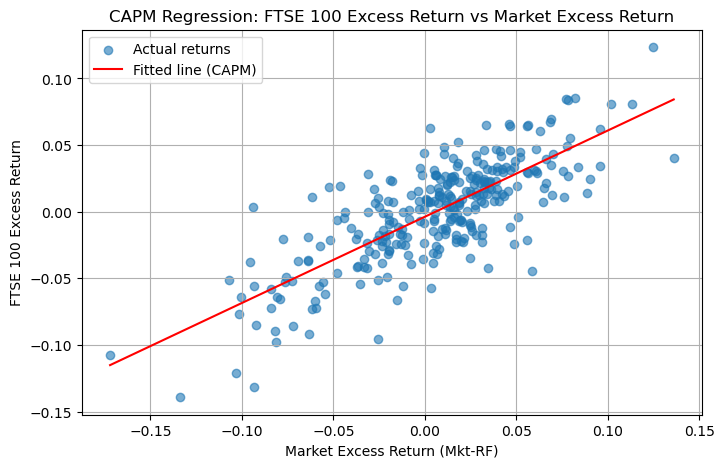

In [168]:
# Let's visualize the fitted regression line (CAPM)

plt.figure(figsize=(8, 5))

# Scatter plot
plt.scatter(data["excess_mkt"], data["excess_FTSE"], alpha=0.6, label="Actual returns")

# Regression line
x_vals = np.linspace(data["excess_mkt"].min(), data["excess_mkt"].max(), 100)
y_vals = capm_model.params["const"] + capm_model.params["excess_mkt"] * x_vals
plt.plot(x_vals, y_vals, color="red", label="Fitted line (CAPM)")

# Let's Labels and give a title
plt.title("CAPM Regression: FTSE 100 Excess Return vs Market Excess Return")
plt.xlabel("Market Excess Return (Mkt-RF)")
plt.ylabel("FTSE 100 Excess Return")
plt.legend()
plt.grid(True)
plt.show()


## 3. Fama–French 3-Factor model

In [169]:

# Dependent variable 
Y = data["excess_FTSE"]

# Independent variables: market excess return + SMB + HML
X_ff3 = data[["excess_mkt", "SMB", "HML"]]

# Add constant (alpha)
X_ff3 = sm.add_constant(X_ff3)

# Run OLS regression
ff3_model = sm.OLS(Y, X_ff3).fit()

# Show summary
print(ff3_model.summary())


                            OLS Regression Results                            
Dep. Variable:            excess_FTSE   R-squared:                       0.624
Model:                            OLS   Adj. R-squared:                  0.621
Method:                 Least Squares   F-statistic:                     163.5
Date:                Fri, 14 Nov 2025   Prob (F-statistic):           2.04e-62
Time:                        06:39:59   Log-Likelihood:                 697.46
No. Observations:                 299   AIC:                            -1387.
Df Residuals:                     295   BIC:                            -1372.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0041      0.001     -2.982      0.0

## 4. Model comparison: CAPM vs FF3-Factor model

In [170]:

comparison = pd.DataFrame({
    "Model": ["CAPM (market only)", "Fama-French 3 factors"],
    "Alpha (const)": [capm_model.params["const"], ff3_model.params["const"]],
    "Beta (mkt)": [capm_model.params["excess_mkt"], ff3_model.params["excess_mkt"]],
    "R_squared": [capm_model.rsquared, ff3_model.rsquared]
})

comparison


,Model,Alpha (const),Beta (mkt),R_squared
0,CAPM (market only),-0.003819,0.647394,0.595836
1,Fama-French 3 factors,-0.004119,0.668800,0.624397


## 5. Comment

- Both the CAPM and the Fama–French 3-Factor model provide a good statistical explanation for the FTSE 100’s excess returns.
- The estimated alpha is not significantly different from zero, in line with CAPM and APT theory that predict no abnormal return.
- The beta is close to one, confirming that the FTSE 100’s risk exposure is largely driven by overall market movements.
- The slight increase in R² under the Fama–French specification indicates that size and value factors marginally improve the model’s explanatory power, though their influence remains limited for a large-capitalization index.